<h1>Load Session

In [1]:
import sys
sys.executable

'/home/gugu/thesis/mpci-transformer/ibl_env/bin/python'

In [2]:
from one.api import ONE
import matplotlib.pyplot as plt
import numpy as np
import sys
import os
import seaborn as sns
import h5py


parent_dir = os.path.dirname(os.getcwd())
if parent_dir not in sys.path:
    sys.path.append(parent_dir)

# Add utils directory to path
utils_dir = os.path.join(parent_dir, 'utils')
if utils_dir not in sys.path:
    sys.path.append(utils_dir)
    
from load_meso_session import MesoscopeSession

one = ONE()

In [3]:
preprocessed_session = MesoscopeSession.from_preprocessed("../DATA/session_5ea6bb9b-6163-4e8a-816b-efe7002666b0.h5")

Preprocessed session loaded from ../DATA/session_5ea6bb9b-6163-4e8a-816b-efe7002666b0.h5
Shape: (18309, 10214) (time_points x neurons)
EID: 5ea6bb9b-6163-4e8a-816b-efe7002666b0, Subject: SP063


#

In [4]:
activity, timestamps = preprocessed_session.get_preprocessed_data()

In [5]:
print(f"{preprocessed_session.stimOn_times[:10]}")
print(f"{preprocessed_session.stimOff_times[:10]}")
print(f"{preprocessed_session.feedback_times[:10]}")

[35.937 39.204 45.353 49.054 52.42  57.737 61.587 64.304 68.687 72.487]
[38.187 40.72  47.754 51.437 56.62  60.32  62.838 67.02  70.054 73.854]
[37.128 39.683 45.705 49.378 54.566 58.248 61.802 64.966 69.015 72.811]


## Wheel Data

In [6]:
len(timestamps) / 4.9

3736.530612244898

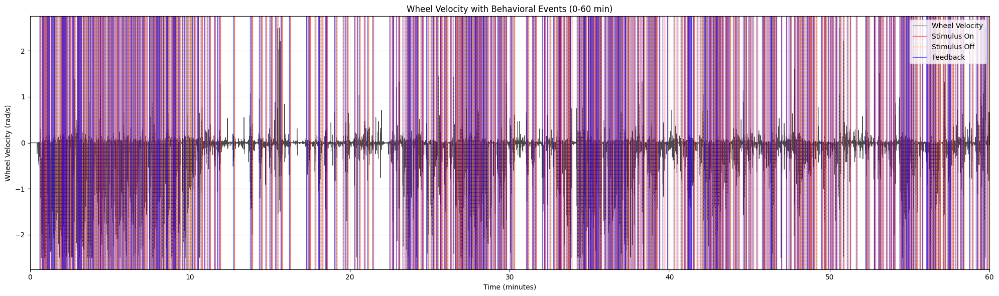

Showing 0-60 minutes
Stimuli on in window: 515
Stimuli off in window: 514
Feedback events in window: 514
Velocity range in window: -2.500 to 2.500 rad/s


In [7]:
# %%
# Plot wheel velocity with behavioral events (with zoom capability)

# Set time window for zooming (in minutes)
start_time_min = 0  # Start at 10 minutes
duration_min = 60     # Show 5 minutes worth of data

# Convert to seconds and find indices
start_time_sec = start_time_min * 60
end_time_sec = start_time_sec + (duration_min * 60)

# Find corresponding indices in neural data
start_idx = np.searchsorted(timestamps, start_time_sec)
end_idx = np.searchsorted(timestamps, end_time_sec)

# Create subset
time_subset = timestamps[start_idx:end_idx]
vel_subset = preprocessed_session.aligned_wheel_velocity[start_idx:end_idx]

fig, ax = plt.subplots(1, 1, figsize=(20, 6))

# Plot wheel velocity as continuous line
ax.plot(time_subset/60, vel_subset, 'k-', linewidth=0.8, alpha=0.7, label='Wheel Velocity')
ax.set_xlabel('Time (minutes)')
ax.set_ylabel('Wheel Velocity (rad/s)')
ax.set_title(f'Wheel Velocity with Behavioral Events ({start_time_min}-{start_time_min+duration_min} min)')

# Plot stimulus onset times in the time window
stim_on_times = preprocessed_session.stimOn_times[~np.isnan(preprocessed_session.stimOn_times)]
stim_in_window = stim_on_times[(stim_on_times >= start_time_sec) & (stim_on_times < end_time_sec)]
for i, stim_time in enumerate(stim_in_window):
    ax.axvline(stim_time/60, color='red', alpha=0.6, linewidth=1, 
              label='Stimulus On' if i == 0 else "")

# Plot stimulus off times in the time window
stim_off_times = preprocessed_session.stimOff_times[~np.isnan(preprocessed_session.stimOff_times)]
stim_off_in_window = stim_off_times[(stim_off_times >= start_time_sec) & (stim_off_times < end_time_sec)]
for i, stim_off_time in enumerate(stim_off_in_window):
    ax.axvline(stim_off_time/60, color='orange', alpha=0.6, linewidth=1, linestyle='--',
              label='Stimulus Off' if i == 0 else "")

# Plot feedback times in the time window
feedback_times = preprocessed_session.feedback_times[~np.isnan(preprocessed_session.feedback_times)]
feedback_in_window = feedback_times[(feedback_times >= start_time_sec) & (feedback_times < end_time_sec)]
for i, feedback_time in enumerate(feedback_in_window):
    ax.axvline(feedback_time/60, color='blue', alpha=0.6, linewidth=1,
              label='Feedback' if i == 0 else "")

# Add legend and grid
ax.legend(loc='upper right')
ax.grid(True, alpha=0.3)
ax.set_xlim(start_time_min, start_time_min + duration_min)

plt.tight_layout()
plt.show()

print(f"Showing {start_time_min}-{start_time_min+duration_min} minutes")
print(f"Stimuli on in window: {len(stim_in_window)}")
print(f"Stimuli off in window: {len(stim_off_in_window)}")
print(f"Feedback events in window: {len(feedback_in_window)}")
print(f"Velocity range in window: {np.min(vel_subset):.3f} to {np.max(vel_subset):.3f} rad/s")

## Filter Timesteps with same Contrast Left/Right

### For each trial, select the same direction of the Grating, same contrast  

In [8]:
def encode_stimulus_types(session, timestamps):
    """
    Create one-hot encoding for stimulus types based on contrast combinations.
    
    Stimulus types are defined by contrast combinations:
    - 0: Catch trials - (left=0 & right=NaN) OR (left=NaN & right=0) - no stimulus, animal uses prior knowledge
    - 1-4: Left side stimuli (100%, 25%, 12.5%, 6.25%) with right=NaN
    - 5-8: Right side stimuli (100%, 25%, 12.5%, 6.25%) with left=NaN
    
    Args:
        session: MesoscopeSession object
        timestamps: 1D array of neural timestamps to encode [n_timepoints]
        
    Returns:
        np.ndarray: One-hot encoded stimulus types [n_timepoints, 9]
    """
    # Define contrast values (excluding 0% as it's catch trial)
    contrast_values = [1.0, 0.25, 0.125, 0.0625]  # 100%, 25%, 12.5%, 6.25%
    
    # Initialize one-hot matrix
    n_timepoints = len(timestamps)
    stimulus_encoding = np.zeros((n_timepoints, 9), dtype=np.float32)
    
    # For each trial, find which timepoints fall within stimulus presentation
    for trial_idx in range(len(session.stimOn_times)):
        stim_on = session.stimOn_times[trial_idx]
        stim_off = session.stimOff_times[trial_idx]
        
        # Skip trials with NaN timing
        if np.isnan(stim_on) or np.isnan(stim_off):
            continue
        
        # Find timepoints within this stimulus period
        mask = (timestamps >= stim_on) & (timestamps <= stim_off)
        
        if not np.any(mask):
            continue
        
        # Get contrasts for this trial
        left_contrast = session.contrastLeft[trial_idx]
        right_contrast = session.contrastRight[trial_idx]
        
        # Keep NaN values as they indicate catch trials
        # Don't convert to 0.0 yet
        
        # Determine stimulus type
        stimulus_type = _get_stimulus_type(left_contrast, right_contrast, contrast_values)
        
        # Set one-hot encoding for this time period
        stimulus_encoding[mask, stimulus_type] = 1.0
    
    return stimulus_encoding

def _get_stimulus_type(left_contrast, right_contrast, contrast_values):
    """
    Map contrasts to stimulus type index.
    
    Stimulus types:
    0: Catch trial (left=0 & right=NaN) OR (left=NaN & right=0) - no stimulus
    1-4: Left stimuli (1.0, 0.25, 0.125, 0.0625) with right=NaN
    5-8: Right stimuli (1.0, 0.25, 0.125, 0.0625) with left=NaN
    
    Returns:
        int: Stimulus type (0-8)
    """
    # Catch trials: no stimulus on either side
    if (left_contrast == 0.0 and np.isnan(right_contrast)) or (np.isnan(left_contrast) and right_contrast == 0.0):
        return 0
    
    # Left stimulus (right = NaN, left has contrast > 0)
    if np.isnan(right_contrast) and not np.isnan(left_contrast) and left_contrast > 0.0:
        try:
            contrast_idx = contrast_values.index(left_contrast)
            return 1 + contrast_idx  # Types 1-4
        except ValueError:
            # Find closest match for floating point precision issues
            distances = [abs(left_contrast - cv) for cv in contrast_values]
            closest_idx = distances.index(min(distances))
            return 1 + closest_idx
    
    # Right stimulus (left = NaN, right has contrast > 0)  
    if np.isnan(left_contrast) and not np.isnan(right_contrast) and right_contrast > 0.0:
        try:
            contrast_idx = contrast_values.index(right_contrast)
            return 5 + contrast_idx  # Types 5-8
        except ValueError:
            # Find closest match for floating point precision issues
            distances = [abs(right_contrast - cv) for cv in contrast_values]
            closest_idx = distances.index(min(distances))
            return 5 + closest_idx
    
    # Default to catch trial if no clear match
    return 0

# Debug timing alignment
print("=== Debugging timing alignment ===")
print(f"Neural timestamps range: {timestamps.min():.3f} to {timestamps.max():.3f}")
print(f"Stimulus on times range: {preprocessed_session.stimOn_times.min():.3f} to {preprocessed_session.stimOn_times.max():.3f}")
print(f"Stimulus off times range: {preprocessed_session.stimOff_times.min():.3f} to {preprocessed_session.stimOff_times.max():.3f}")
print(f"Number of trials: {len(preprocessed_session.stimOn_times)}")

# Check a few example trials
print("\n=== Example trials ===")
for i in range(min(5, len(preprocessed_session.stimOn_times))):
    stim_on = preprocessed_session.stimOn_times[i]
    stim_off = preprocessed_session.stimOff_times[i]
    left_c = preprocessed_session.contrastLeft[i]
    right_c = preprocessed_session.contrastRight[i]
    
    # Check if any timestamps fall in this range
    mask = (timestamps >= stim_on) & (timestamps <= stim_off)
    n_timepoints = np.sum(mask)
    
    print(f"Trial {i}: stim_on={stim_on:.3f}, stim_off={stim_off:.3f}, left={left_c}, right={right_c}, timepoints={n_timepoints}")

# Test the encoding function
stimulus_onehot = encode_stimulus_types(preprocessed_session, timestamps)
print(f"\n=== Results ===")
print(f"Stimulus encoding shape: {stimulus_onehot.shape}")
print(f"Timestamps shape: {timestamps.shape}")
print(f"Unique stimulus types present: {np.where(stimulus_onehot.sum(axis=0) > 0)[0]}")
print(f"Total timepoints with stimulus: {stimulus_onehot.sum()}")
print(f"Proportion of time with stimulus: {stimulus_onehot.sum() / len(timestamps):.3f}")

print(stimulus_onehot[0:10])
# Check contrast distribution
print(f"\n=== Contrast distribution ===")
left_unique = np.unique(preprocessed_session.contrastLeft[~np.isnan(preprocessed_session.contrastLeft)])
right_unique = np.unique(preprocessed_session.contrastRight[~np.isnan(preprocessed_session.contrastRight)])
print(f"Unique left contrasts: {left_unique}")
print(f"Unique right contrasts: {right_unique}")

=== Debugging timing alignment ===
Neural timestamps range: 2.033 to 3667.133
Stimulus on times range: 35.937 to 3655.478
Stimulus off times range: 38.187 to 3667.244
Number of trials: 521

=== Example trials ===
Trial 0: stim_on=35.937, stim_off=38.187, left=0.0, right=nan, timepoints=11
Trial 1: stim_on=39.204, stim_off=40.720, left=1.0, right=nan, timepoints=8
Trial 2: stim_on=45.353, stim_off=47.754, left=nan, right=0.125, timepoints=12
Trial 3: stim_on=49.054, stim_off=51.437, left=nan, right=1.0, timepoints=12
Trial 4: stim_on=52.420, stim_off=56.620, left=nan, right=1.0, timepoints=21

=== Results ===
Stimulus encoding shape: (18309, 9)
Timestamps shape: (18309,)
Unique stimulus types present: [0 1 2 3 4 5 6 7 8]
Total timepoints with stimulus: 13737.0
Proportion of time with stimulus: 0.750
[[0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0.

In [9]:
stimulus_onehot[130:160]

array([[0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0.

In [10]:
stim_on_times

array([  35.937,   39.204,   45.353,   49.054,   52.42 ,   57.737,
         61.587,   64.304,   68.687,   72.487,   77.736,   82.037,
         86.104,   90.087,   92.887,   96.204,  100.487,  104.138,
        111.153,  114.587,  117.887,  120.303,  124.103,  127.97 ,
        131.32 ,  134.687,  139.903,  144.687,  150.237,  157.153,
        162.27 ,  167.02 ,  176.503,  179.02 ,  181.854,  184.187,
        188.837,  192.753,  198.921,  204.403,  209.37 ,  212.97 ,
        217.853,  221.153,  224.22 ,  228.67 ,  232.836,  237.237,
        241.386,  246.453,  250.37 ,  254.27 ,  259.703,  263.47 ,
        268.32 ,  272.553,  275.737,  280.787,  285.32 ,  292.953,
        295.703,  299.303,  303.803,  308.103,  312.136,  316.27 ,
        324.153,  328.987,  331.886,  340.337,  345.736,  351.17 ,
        354.386,  360.42 ,  363.436,  369.153,  373.436,  378.369,
        381.386,  386.053,  391.503,  394.969,  399.786,  403.469,
        409.236,  415.07 ,  419.736,  424.219,  427.87 ,  433.

In [11]:
from rastermap import Rastermap

model = Rastermap(n_clusters=100, # number of clusters to compute
                  n_PCs=200, # number of PCs
                  locality=0.5, # locality in sorting is low here to get more global sorting (this is a value from 0-1)
                  time_lag_window=5, # use future timepoints to compute correlation
                  grid_upsample=10, # default value, 10 is good for large recordings
                  ).fit(activity.T)

2025-08-12 16:55:26,368 [INFO] normalizing data across axis=1
2025-08-12 16:55:33,291 [INFO] projecting out mean along axis=0
2025-08-12 16:55:34,366 [INFO] data normalized, 8.00sec
2025-08-12 16:55:34,368 [INFO] sorting activity: 10214 valid samples by 18309 timepoints
2025-08-12 16:55:56,501 [INFO] n_PCs = 200 computed, 30.13sec
2025-08-12 16:56:08,029 [INFO] 100 clusters computed, time 41.66sec
2025-08-12 16:56:36,715 [INFO] clusters sorted, time 70.31sec
2025-08-12 16:56:37,575 [INFO] clusters upsampled, time 71.21sec
2025-08-12 16:56:44,162 [INFO] rastermap complete, time 77.79sec


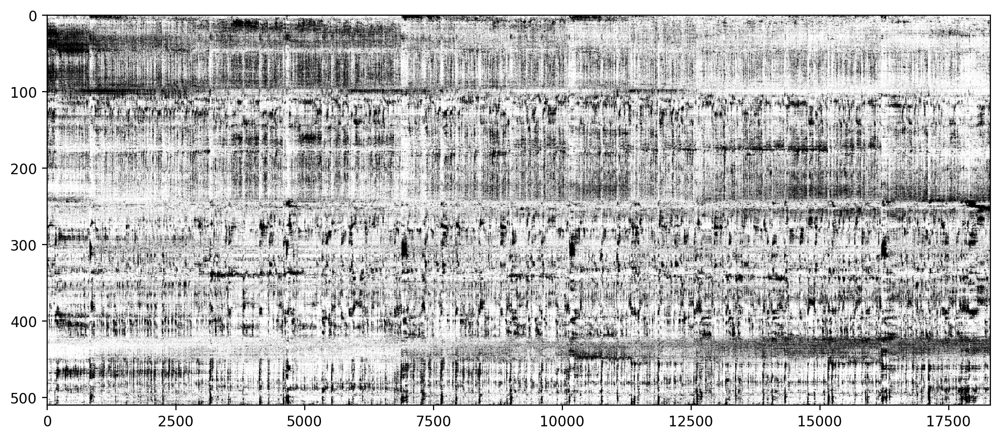

In [12]:
y = model.embedding # neurons x 1
isort = model.isort

# visualize binning over neurons
X_embedding = model.X_embedding

# plot

fig = plt.figure(figsize=(12,5), dpi=200)
ax = fig.add_subplot(111)
ax.imshow(X_embedding, vmin=0, vmax=0.8, cmap="gray_r", aspect="auto")

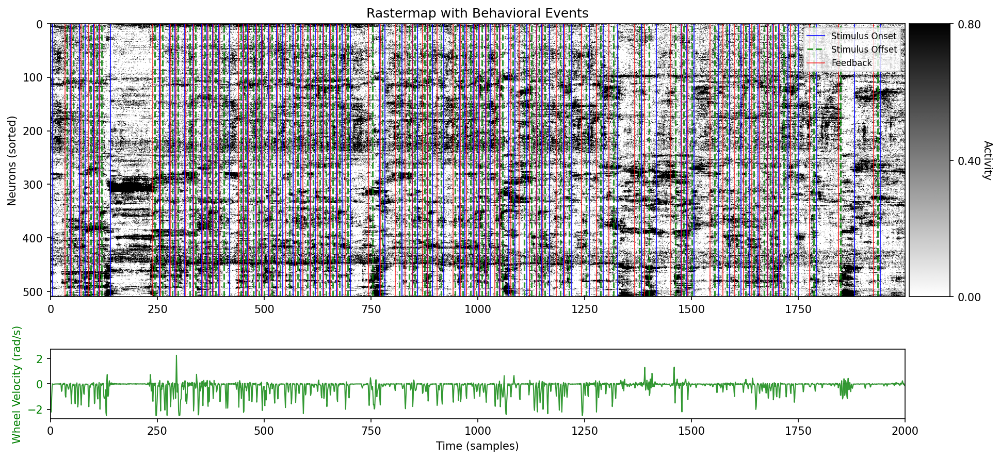

Velocity stats for window:
  Range: -2.500 to 2.263 rad/s
  Non-zero samples: 2000/2000 (100.0%)
  Mean |velocity|: 0.277 rad/s


In [13]:
import matplotlib.patches as patches

# Define time window for visualization (in sample indices)
xmin_idx = 10000
xmax_idx = 12000

def plot_behavioral_events(ax, stim_times, stim_off_times, feedback_times, timestamps, xmin_idx, xmax_idx):
    """Plot stimulus onset/offset times and feedback times as vertical lines"""
    # Convert time indices to actual time
    xmin_time = timestamps[xmin_idx] if xmin_idx < len(timestamps) else timestamps[-1]
    xmax_time = timestamps[xmax_idx] if xmax_idx < len(timestamps) else timestamps[-1]
    
    # Get number of neurons for y-axis scaling
    nn = X_embedding.shape[0]
    
    # Filter stimulus onset times to the visible time window
    stim_times_filtered = stim_times[~np.isnan(stim_times)]  # Remove NaN values
    stim_times_visible = stim_times_filtered[
        (stim_times_filtered >= xmin_time) & (stim_times_filtered < xmax_time)
    ]
    
    # Filter stimulus offset times to the visible time window
    stim_off_filtered = stim_off_times[~np.isnan(stim_off_times)]  # Remove NaN values
    stim_off_visible = stim_off_filtered[
        (stim_off_filtered >= xmin_time) & (stim_off_filtered < xmax_time)
    ]
        
    # Filter feedback times to the visible time window
    feedback_times_filtered = feedback_times[~np.isnan(feedback_times)]  # Remove NaN values
    feedback_times_visible = feedback_times_filtered[
        (feedback_times_filtered >= xmin_time) & (feedback_times_filtered < xmax_time)
    ]
    
    # Convert times to sample indices for plotting
    sampling_rate = 1 / np.mean(np.diff(timestamps))
    
    # Plot stimulus onsets
    for stim_time in stim_times_visible:
        stim_idx = int((stim_time - xmin_time) * sampling_rate)
        if 0 <= stim_idx < (xmax_idx - xmin_idx):
            ax.axvline(x=stim_idx, color='blue', linewidth=1, alpha=0.8, 
                      label='Stimulus Onset' if stim_time == stim_times_visible[0] else "")
    
    # Plot stimulus offsets
    for stim_off_time in stim_off_visible:
        stim_off_idx = int((stim_off_time - xmin_time) * sampling_rate)
        if 0 <= stim_off_idx < (xmax_idx - xmin_idx):
            ax.axvline(x=stim_off_idx, color='green', linewidth=1.5, alpha=0.8, linestyle='--',
                      label='Stimulus Offset' if stim_off_time == stim_off_visible[0] else "")
    
    # Plot feedback times
    for feedback_time in feedback_times_visible:
        feedback_idx = int((feedback_time - xmin_time) * sampling_rate)
        if 0 <= feedback_idx < (xmax_idx - xmin_idx):
            ax.axvline(x=feedback_idx, color='red', linewidth=0.8, alpha=0.8,
                      label='Feedback' if feedback_time == feedback_times_visible[0] else "")
    
    ax.set_ylim([0, nn])
    ax.invert_yaxis()

def plot_wheel_velocity(ax, aligned_wheel_velocity, timestamps, xmin_idx, xmax_idx):
    """Plot wheel velocity trace as a single continuous line"""
    # Get wheel velocity for the time window
    wheel_vel_window = aligned_wheel_velocity[xmin_idx:xmax_idx]
    time_indices = np.arange(len(wheel_vel_window))
    
    # Plot velocity as a single continuous line
    ax.plot(time_indices, wheel_vel_window, color='green', linewidth=1, alpha=0.8)
    
    # Add horizontal line at zero for reference
    ax.axhline(y=0, color='black', linewidth=0.5, alpha=0.5, linestyle='--')
    
    ax.set_ylabel('Wheel Velocity (rad/s)', color='green')
    ax.tick_params(axis='y', labelcolor='green')
    ax.set_xlim(0, len(wheel_vel_window))
    
    # Set y-axis limits to show velocity range clearly
    vel_max = np.max(np.abs(wheel_vel_window))
    if vel_max > 0:
        ax.set_ylim(-vel_max*1.1, vel_max*1.1)
    else:
        ax.set_ylim(-0.1, 0.1)  # Show small range if all zeros


# Create figure with grid for easy plotting
fig = plt.figure(figsize=(15, 8), dpi=150)
grid = plt.GridSpec(12, 20, figure=fig, wspace=0.1, hspace=0.4)

# Plot rastermap with behavioral events
ax_raster = plt.subplot(grid[2:9, :-1])
ax_raster.imshow(X_embedding[:, xmin_idx:xmax_idx], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
ax_raster.set_ylabel("Neurons (sorted)")
ax_raster.set_title("Rastermap with Behavioral Events")

# Add behavioral events
plot_behavioral_events(ax_raster, preprocessed_session.stimOn_times, preprocessed_session.stimOff_times, preprocessed_session.feedback_times, timestamps, xmin_idx, xmax_idx)

ax_cbar = plt.subplot(grid[2:9, -1])
activity_gradient = np.linspace(0.8, 0, X_embedding.shape[0])[:, np.newaxis]  # High at top
ax_cbar.imshow(activity_gradient, cmap="gray_r", aspect="auto", vmin=0, vmax=0.8)
ax_cbar.yaxis.set_label_position("right")
ax_cbar.set_ylabel("Activity", rotation=270, labelpad=10)
ax_cbar.set_yticks([0, X_embedding.shape[0]//2, X_embedding.shape[0]-1])
ax_cbar.set_yticklabels(['0.80', '0.40', '0.00'])
ax_cbar.set_xticks([])
ax_cbar.yaxis.tick_right()

# Plot wheel velocity below the rastermap
ax_wheel = plt.subplot(grid[10:12, :-1])
plot_wheel_velocity(ax_wheel, preprocessed_session.aligned_wheel_velocity, timestamps, xmin_idx, xmax_idx)
ax_wheel.set_xlabel("Time (samples)")

# Add legend
ax_raster.legend(loc='upper right', fontsize=8)

# plt.tight_layout()
plt.show()

# Print velocity statistics for this window
vel_window = preprocessed_session.aligned_wheel_velocity[xmin_idx:xmax_idx]
print(f"Velocity stats for window:")
print(f"  Range: {np.min(vel_window):.3f} to {np.max(vel_window):.3f} rad/s")
print(f"  Non-zero samples: {np.sum(vel_window != 0)}/{len(vel_window)} ({100*np.sum(vel_window != 0)/len(vel_window):.1f}%)")
print(f"  Mean |velocity|: {np.mean(np.abs(vel_window)):.3f} rad/s")





In [14]:
print(preprocessed_session.contrastLeft[0:8])
print(preprocessed_session.contrastRight[0:8])

[0.   1.    nan  nan  nan  nan 0.25  nan]
[  nan   nan 0.125 1.    1.    0.      nan 0.   ]


In [15]:
import treescope
treescope.basic_interactive_setup(autovisualize_arrays=True)

In [16]:
stack = np.column_stack((preprocessed_session.contrastLeft, preprocessed_session.contrastRight)).T


In [17]:
stack

array([[0.   , 1.   ,   nan, ..., 0.125,   nan,   nan],
       [  nan,   nan, 0.125, ...,   nan, 0.   , 0.   ]], shape=(2, 521))

In [18]:
len(timestamps)

18309

In [19]:
xmax_idx

12000

In [20]:
for i in range(0,stack.shape[1]):
    # print(stack[0,i], stack[1, i])
    if stack[0,i] == 0 and stack[1, i] == 0:
        print("hello")    
    if np.isnan(stack[0,i]) and np.isnan(stack[1, i]):
        print("hello")

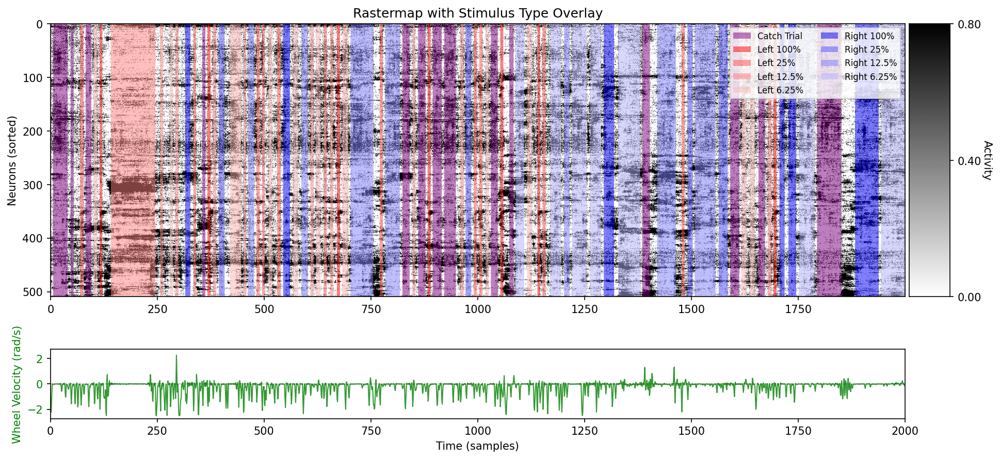

Velocity stats for window:
  Range: -2.500 to 2.263 rad/s
  Non-zero samples: 2000/2000 (100.0%)
  Mean |velocity|: 0.277 rad/s


In [21]:
def create_stimulus_overlay(stimulus_onehot, xmin_idx, xmax_idx):
    """Create a colored overlay for stimulus types"""
    # Get stimulus data for the time window
    stim_window = stimulus_onehot[xmin_idx:xmax_idx]
    
    # Define colors for each stimulus type
    # 0: Catch trials (purple)
    # 1-4: Left stimuli (different shades of red)
    # 5-8: Right stimuli (different shades of blue)
    colors = [
        [0.5, 0, 0.5, 0.5],  # 0: Purple (catch trials - no stimulus)
        [1, 0, 0, 0.5],      # 1: Left 100% - dark red
        [1, 0.3, 0.3, 0.5],  # 2: Left 25% - medium red
        [1, 0.5, 0.5, 0.5],  # 3: Left 12.5% - light red
        [1, 0.7, 0.7, 0.5],  # 4: Left 6.25% - very light red
        [0, 0, 1, 0.5],      # 5: Right 100% - dark blue
        [0.3, 0.3, 1, 0.5],  # 6: Right 25% - medium blue
        [0.5, 0.5, 1, 0.5],  # 7: Right 12.5% - light blue
        [0.7, 0.7, 1, 0.5]   # 8: Right 6.25% - very light blue
    ]
    
    # Convert one-hot to stimulus type indices
    stim_types = np.argmax(stim_window, axis=1)
    
    # Create RGB overlay
    nn = X_embedding.shape[0]  # Number of neurons
    overlay = np.zeros((nn, len(stim_types), 4))  # RGBA
    
    for t, stim_type in enumerate(stim_types):
        if np.any(stim_window[t]):  # Only color if there's a stimulus
            overlay[:, t] = colors[stim_type]
    
    return overlay

# Create figure for stimulus-colored rastermap with wheel velocity
fig = plt.figure(figsize=(15, 8), dpi=150)
grid = plt.GridSpec(12, 20, figure=fig, wspace=0.1, hspace=0.4)


# Plot rastermap (keep original scaling)
ax_raster = plt.subplot(grid[2:9, :-1])
ax_raster.imshow(X_embedding[:, xmin_idx:xmax_idx], cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")

# Create and overlay stimulus colors
stim_overlay = create_stimulus_overlay(stimulus_onehot, xmin_idx, xmax_idx)
ax_raster.imshow(stim_overlay, aspect="auto")

ax_raster.set_ylabel("Neurons (sorted)")
ax_raster.set_title("Rastermap with Stimulus Type Overlay")

ax_cbar = plt.subplot(grid[2:9, -1])
activity_gradient = np.linspace(0.8, 0, X_embedding.shape[0])[:, np.newaxis]  # High at top
ax_cbar.imshow(activity_gradient, cmap="gray_r", aspect="auto", vmin=0, vmax=0.8)
ax_cbar.yaxis.set_label_position("right")
ax_cbar.set_ylabel("Activity", rotation=270, labelpad=10)
ax_cbar.set_yticks([0, X_embedding.shape[0]//2, X_embedding.shape[0]-1])
ax_cbar.set_yticklabels(['0.80', '0.40', '0.00'])
ax_cbar.set_xticks([])
ax_cbar.yaxis.tick_right()

# Plot wheel velocity below the rastermap (bigger vertical space)
ax_wheel = plt.subplot(grid[10:12, :-1])
plot_wheel_velocity(ax_wheel, preprocessed_session.aligned_wheel_velocity, timestamps, xmin_idx, xmax_idx)
ax_wheel.set_xlabel("Time (samples)")

# Create legend for stimulus types
from matplotlib.patches import Patch
legend_elements = [
    Patch(facecolor=(0.5, 0, 0.5, 0.5), label='Catch Trial'),
    Patch(facecolor=(1, 0, 0, 0.5), label='Left 100%'),
    Patch(facecolor=(1, 0.3, 0.3, 0.5), label='Left 25%'),
    Patch(facecolor=(1, 0.5, 0.5, 0.5), label='Left 12.5%'),
    Patch(facecolor=(1, 0.7, 0.7, 0.5), label='Left 6.25%'),
    Patch(facecolor=(0, 0, 1, 0.5), label='Right 100%'),
    Patch(facecolor=(0.3, 0.3, 1, 0.5), label='Right 25%'),
    Patch(facecolor=(0.5, 0.5, 1, 0.5), label='Right 12.5%'),
    Patch(facecolor=(0.7, 0.7, 1, 0.5), label='Right 6.25%')
]
ax_raster.legend(handles=legend_elements, loc='upper right', fontsize=8, ncol=2)

plt.show()

# Print velocity statistics for this window
vel_window = preprocessed_session.aligned_wheel_velocity[xmin_idx:xmax_idx]
print(f"Velocity stats for window:")
print(f"  Range: {np.min(vel_window):.3f} to {np.max(vel_window):.3f} rad/s")
print(f"  Non-zero samples: {np.sum(vel_window != 0)}/{len(vel_window)} ({100*np.sum(vel_window != 0)/len(vel_window):.1f}%)")
print(f"  Mean |velocity|: {np.mean(np.abs(vel_window)):.3f} rad/s")


In [28]:
stimulus_onehot[10000:10150].T

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], shape=(9, 150), dtype=float32)

In [22]:
print("=== DEBUG: Stimulus Overlay Alignment ===")

# Check the time window we're plotting
print(f"Time window indices: {xmin_idx} to {xmax_idx} (span: {xmax_idx - xmin_idx} samples)")
print(f"Time window in seconds: {timestamps[xmin_idx]:.2f}s to {timestamps[xmax_idx-1]:.2f}s")

# Get stimulus data for this window
stim_window = stimulus_onehot[xmin_idx:xmax_idx]
print(f"Stimulus window shape: {stim_window.shape}")

# Find trials that should be in this time window
window_start_time = timestamps[xmin_idx]
window_end_time = timestamps[xmax_idx-1] if xmax_idx <= len(timestamps) else timestamps[-1]

stim_on_in_window = []
stim_off_in_window = []
trial_indices = []

for trial_idx in range(len(preprocessed_session.stimOn_times)):
    stim_on = preprocessed_session.stimOn_times[trial_idx]
    stim_off = preprocessed_session.stimOff_times[trial_idx]
    
    if (not np.isnan(stim_on) and not np.isnan(stim_off) and 
        stim_on >= window_start_time and stim_off <= window_end_time):
        stim_on_in_window.append(stim_on)
        stim_off_in_window.append(stim_off)
        trial_indices.append(trial_idx)
        
        # Check stimulus encoding for this trial
        left_c = preprocessed_session.contrastLeft[trial_idx]
        right_c = preprocessed_session.contrastRight[trial_idx]
        
        print(f"Trial {trial_idx}: stim_on={stim_on:.2f}s, stim_off={stim_off:.2f}s")
        print(f"  Contrasts: left={left_c}, right={right_c}")
        
        # Find corresponding indices in timestamps
        on_idx = np.searchsorted(timestamps, stim_on) - xmin_idx
        off_idx = np.searchsorted(timestamps, stim_off) - xmin_idx
        
        print(f"  Relative indices in window: on={on_idx}, off={off_idx}")
        
        # Check what stimulus encoding says for this period
        if 0 <= on_idx < len(stim_window) and 0 <= off_idx < len(stim_window):
            stim_during_period = stim_window[on_idx:off_idx+1]
            active_types = np.where(stim_during_period.sum(axis=0) > 0)[0]
            print(f"  Encoded stimulus types during period: {active_types}")
        else:
            print(f"  WARNING: Indices out of bounds for stimulus window")

print(f"\nTotal trials in window: {len(trial_indices)}")

# Check if there are any stimulus encodings in our window
active_timepoints = np.where(stim_window.sum(axis=1) > 0)[0]
print(f"Timepoints with stimulus encoding: {len(active_timepoints)}/{len(stim_window)}")

if len(active_timepoints) > 0:
    print(f"First active timepoint: {active_timepoints[0]} (time: {timestamps[xmin_idx + active_timepoints[0]]:.2f}s)")
    print(f"Last active timepoint: {active_timepoints[-1]} (time: {timestamps[xmin_idx + active_timepoints[-1]]:.2f}s)")
    
    # Show stimulus types present
    stim_types_present = np.where(stim_window.sum(axis=0) > 0)[0]
    print(f"Stimulus types present in window: {stim_types_present}")
else:
    print("No stimulus encodings found in this window!")

=== DEBUG: Stimulus Overlay Alignment ===
Time window indices: 10000 to 12000 (span: 2000 samples)
Time window in seconds: 2003.90s to 2404.09s
Stimulus window shape: (2000, 9)
Trial 273: stim_on=2005.03s, stim_off=2011.90s
  Contrasts: left=0.0, right=nan
  Relative indices in window: on=6, off=40
  Encoded stimulus types during period: [0]
Trial 274: stim_on=2013.16s, stim_off=2014.66s
  Contrasts: left=0.0, right=nan
  Relative indices in window: on=47, off=54
  Encoded stimulus types during period: [0]
Trial 275: stim_on=2017.67s, stim_off=2019.23s
  Contrasts: left=0.25, right=nan
  Relative indices in window: on=69, off=77
  Encoded stimulus types during period: [2]
Trial 276: stim_on=2020.27s, stim_off=2022.80s
  Contrasts: left=0.0, right=nan
  Relative indices in window: on=82, off=95
  Encoded stimulus types during period: [0]
Trial 277: stim_on=2024.03s, stim_off=2025.57s
  Contrasts: left=0.0625, right=nan
  Relative indices in window: on=101, off=109
  Encoded stimulus typ

Stimulus type 8 (Right 6.25%):
  - 63 blocks found
  - 2493 total timepoints
  - ~499.1s total duration


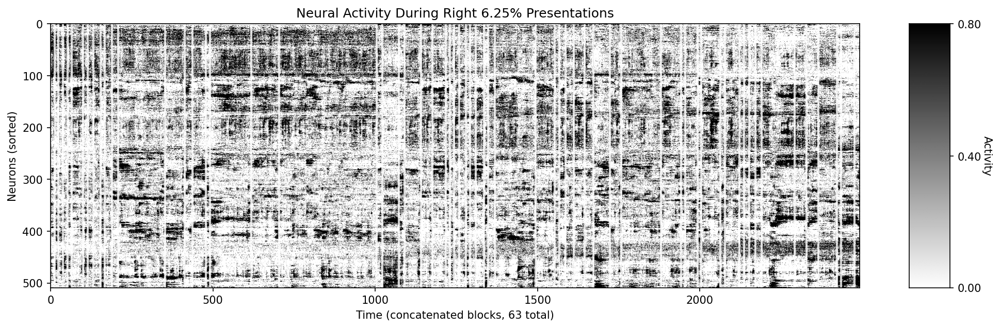

In [23]:
def plot_stimulus_specific_blocks(stimulus_onehot, X_embedding, stimulus_type, timestamps):
    """
    Plot only the time blocks where a specific stimulus type was presented.
    
    Args:
        stimulus_onehot: One-hot encoded stimulus data [n_timepoints, 9]
        X_embedding: Rastermap embedding [n_neurons, n_timepoints]
        stimulus_type: Integer 0-8 representing stimulus type
        timestamps: Array of timestamps
        
    Stimulus types:
    0: No stimulus (catch trials)
    1-4: Left stimuli (100%, 25%, 12.5%, 6.25%)
    5-8: Right stimuli (100%, 25%, 12.5%, 6.25%)
    """
    
    # Find all timepoints where this stimulus type was active
    stimulus_mask = stimulus_onehot[:, stimulus_type] == 1
    stimulus_indices = np.where(stimulus_mask)[0]
    
    if len(stimulus_indices) == 0:
        print(f"No timepoints found for stimulus type {stimulus_type}")
        return
    
    # Find continuous blocks of this stimulus
    blocks = []
    block_start = stimulus_indices[0]
    
    for i in range(1, len(stimulus_indices)):
        # If there's a gap, end current block and start new one
        if stimulus_indices[i] - stimulus_indices[i-1] > 1:
            blocks.append((block_start, stimulus_indices[i-1]))
            block_start = stimulus_indices[i]
    
    # Add the final block
    blocks.append((block_start, stimulus_indices[-1]))
    
    # Extract neural data for each block and concatenate
    stimulus_blocks = []
    block_boundaries = [0]  # Track where each block starts in concatenated data
    
    for start_idx, end_idx in blocks:
        block_data = X_embedding[:, start_idx:end_idx+1]
        stimulus_blocks.append(block_data)
        block_boundaries.append(block_boundaries[-1] + block_data.shape[1])
    
    # Concatenate all blocks
    concatenated_data = np.concatenate(stimulus_blocks, axis=1)
    
    # Create stimulus type labels
    stimulus_labels = {
        0: "No Stimulus (Catch)",
        1: "Left 100%", 2: "Left 25%", 3: "Left 12.5%", 4: "Left 6.25%",
        5: "Right 100%", 6: "Right 25%", 7: "Right 12.5%", 8: "Right 6.25%"
    }
    
    # Plot the concatenated stimulus blocks
    fig = plt.figure(figsize=(15, 6), dpi=150)
    grid = plt.GridSpec(8, 20, figure=fig, wspace=0.1, hspace=0.4)
    
    ax_raster = plt.subplot(grid[1:7, :-2])
    ax_raster.imshow(concatenated_data, cmap="gray_r", vmin=0, vmax=0.8, aspect="auto")
    
    # Add vertical lines to separate blocks
    for boundary in block_boundaries[1:-1]:  # Skip first (0) and last
        ax_raster.axvline(x=boundary-0.5, color='white', linewidth=2, alpha=0.8)
    
    ax_raster.set_ylabel("Neurons (sorted)")
    ax_raster.set_title(f"Neural Activity During {stimulus_labels[stimulus_type]} Presentations")
    ax_raster.set_xlabel(f"Time (concatenated blocks, {len(blocks)} total)")
    
    # Add colorbar
    ax_cbar = plt.subplot(grid[1:7, -1])
    activity_gradient = np.linspace(0.8, 0, concatenated_data.shape[0])[:, np.newaxis]
    ax_cbar.imshow(activity_gradient, cmap="gray_r", aspect="auto", vmin=0, vmax=0.8)
    ax_cbar.yaxis.set_label_position("right")
    ax_cbar.set_ylabel("Activity", rotation=270, labelpad=10)
    ax_cbar.set_yticks([0, concatenated_data.shape[0]//2, concatenated_data.shape[0]-1])
    ax_cbar.set_yticklabels(['0.80', '0.40', '0.00'])
    ax_cbar.set_xticks([])
    ax_cbar.yaxis.tick_right()
    
    # Print summary
    total_timepoints = concatenated_data.shape[1]
    total_duration = len(stimulus_indices) * np.mean(np.diff(timestamps))
    print(f"Stimulus type {stimulus_type} ({stimulus_labels[stimulus_type]}):")
    print(f"  - {len(blocks)} blocks found")
    print(f"  - {total_timepoints} total timepoints")
    print(f"  - ~{total_duration:.1f}s total duration")
    
    plt.show()
    
    return concatenated_data, blocks

# Example usage - plot Left 100% stimulus blocks
stimulus_data, blocks = plot_stimulus_specific_blocks(stimulus_onehot, X_embedding, 8, timestamps)